In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import torch
import plenoptic as po
import scipy.io as sio
import os
import os.path as op
import glob
import math
import pyrtools as pt
from tqdm import tqdm
from PIL import Image
%load_ext autoreload
%autoreload 

# Portilla-Simoncelli Texture Metamer tutorial

**In this tutorial we will:**
1. Demonstrate how to compute metamers for the texture model, [Portilla & Simoncelli (1999)](https://www.cns.nyu.edu/pub/eero/portilla99-reprint.pdf). 
2. Replicate most of the synthesis tests described in the paper.
3. Provide list of notable differences between the MATLAB and python implementations of the Portilla Simoncelli texture model.

## 1. Introduction - Metamers
How can we assess whether a model sees like we do?
One way is to generate samples of images that "look the same" to the model and see if they also "look the same" to a human.

For a model, two images are metamers if the model response to both images is equal (within some tolerance).  Generating a metamer starts with a target image:

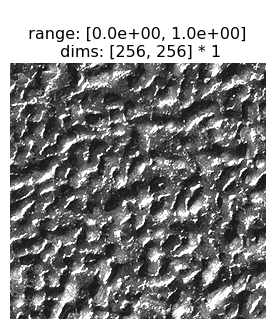

In [2]:
img = po.tools.load_images(['../data/256/metal.pgm'])
po.imshow(img);

For this first example we will use a simple Linear-Nonlinear model of visual neurons.  Below we have initialized a linearNonlinear model `lnl`.  Then we print the output of the model applied to the image above.

In [3]:
# todo -- do this with Portilla Simoncelli instead -- remove all of this other stuff -- 
# it was distracting when I was trying to walk Eero through the code.

lnl = po.simul.LinearNonlinear((7, 7))
print(lnl(img))

tensor([[[[ 667436.4375,       0.0000,       0.0000,  ...,       0.0000,
                 0.0000,       0.0000],
          [ 661023.5625,       0.0000,       0.0000,  ...,       0.0000,
                 0.0000,       0.0000],
          [ 682629.7500,       0.0000,       0.0000,  ...,       0.0000,
            513823.5625, 1226848.3750],
          ...,
          [ 117513.3906,       0.0000,       0.0000,  ...,       0.0000,
                 0.0000,       0.0000],
          [      0.0000,       0.0000,       0.0000,  ...,  803981.9375,
           1122583.7500, 1311252.8750],
          [      0.0000,       0.0000,       0.0000,  ..., 1668706.1250,
           2419527.0000, 2759853.5000]]]], grad_fn=<SoftplusBackward>)


To use `Metamer`, simply initialize it with the target image and the model, then call `.synthesize()`. By setting `store_progress=True`, we update a variety of attributes (all of which start with `saved_`) on each iteration so we can later examine, for example, the synthesized image over time.

In [4]:
met = po.synth.Metamer(img, lnl)
met.synthesize(store_progress=True, max_iter=10)

  0%|          | 0/10 [00:00<?, ?it/s]

tensor([[[[ 0.3099, -0.0723,  0.6041,  ...,  0.4421,  0.6646,  0.5897],
          [ 0.7289,  0.1733,  0.6737,  ...,  0.2848,  0.1396,  0.1467],
          [ 0.2681,  0.7469,  0.6439,  ...,  0.3477,  0.6532,  0.8377],
          ...,
          [ 0.8410,  0.7528,  0.8373,  ...,  0.5714,  0.1921,  0.6585],
          [ 0.4085,  0.9183,  0.2399,  ...,  0.6799,  0.8920,  0.9354],
          [ 0.9346,  0.2015,  0.7190,  ...,  0.4420,  0.1996,  0.9788]]]],
       requires_grad=True)

We then call the `plot_synthesis_status` method to see how things are doing. The image on the left shows the metamer at this moment, while the center plot shows the loss over time, with the red dot pointing out the current loss, and the rightmost plot shows the representation error. If a model has a `plot_representation` method, this plot can be more informative, but this plot can always be created. We here see the difference in representations split up across the different output channels.

/Users/kathrynbonnen/Documents/work-repos/plenoptic/plenoptic/tools/display.py:960: UserWarning: ax is not None, so we're ignoring figsize...
  warnings.warn("ax is not None, so we're ignoring figsize...")


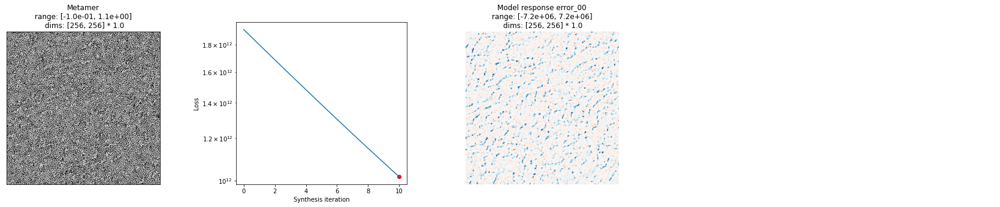

In [5]:
# representation_error plot has three subplots, so we increase its relative width
po.synth.metamer.plot_synthesis_status(met, width_ratios={'model_response_error': 3.1});

## 2. Portilla-Simoncelli Texture Model

But you came here to make Portilla-Simoncelli metamers.  So let's do that.  Below we instantiate a `PortillaSimoncelli` model. You'll notice that the only input that the `PortillaSimoncelli` is the [n,n] size of the image.  The default parameters of PortillaSimoncelli are:
- n_scales=4, The number of scales in the steerable pyramid underlying the model.
- n_orientations=4, The number of orientations in the steerable pyramid.
- spatial_corr_width=9, The size of the window used to calculate the correlations across steerable pyramid bands.


In [14]:
n=img.shape[-1]
# 1x1xnxn
model = po.simul.PortillaSimoncelli([n/2,n])
stats = model.forward(img)


torch.Size([1, 1, 128, 256])


TypeError: forward() missing 1 required positional argument: 'image'

In the next block we generate a metamer using the PortillaSimoncelli model, setting the following parameters for synthesis: `max_iter`, `store_progress`,`coarse_to_fine`, and `coarse_to_fine_kwargs`.  
- `max_iter=1000` puts an upper bound (of 1000) on the number of iterations that the optimization will run.
- `store_progress=True` tells the metamer class to store the progress of the metamer synthesis process
- `coarse_to_fine='together'` activates the coarse_to_fine functionality.  With this mode turned on the metamer synthesis optimizes the image for the statistics associated with the low spatial frequency bands first, adding subsequent bands after `ctf_iters_to_check` iterations. (Note that you could also set a threshold for this using `change_scale_criterion`, but we set that to None to deactivate it.)

It takes about 50s to run 100 iterations on my laptop.  And it takes hundreds of iterations to get convergence. So you'll have to wait a few minutes to generate the texture metamer. 

Note: the first line in the next cell creates an initial uniform noise image with range mean(target_signal)+[-.05,.05].  Initial images with uniform random noise covering the full pixel domain [0,1] (which is the default choice for Metamer) don't result in the very best metamers.  With the full range initial image, the optimization seems to get stuck.

In [7]:
im_init = (torch.rand_like(img)-.5) * .1 + img.mean();
met = po.synth.Metamer(img, model, loss_function=po.tools.optim.l2_norm, initial_image=im_init)
o=met.synthesize(
    max_iter=1000,
    store_progress=True,
    coarse_to_fine='together', 
    coarse_to_fine_kwargs={'change_scale_criterion': None, 'ctf_iters_to_check': 7}
    )



/Users/kathrynbonnen/Documents/work-repos/plenoptic/plenoptic/simulate/models/portilla_simoncelli.py:560: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at  /Users/distiller/project/conda/conda-bld/pytorch_1616554799287/work/aten/src/ATen/native/Copy.cpp:219.)
  return im_large.type(im.dtype)


  0%|          | 0/1000 [00:00<?, ?it/s]

Now we can visualize the output of the synthesis optimization. First we compare the *Target image* and the *Synthesized image* side-by-side.

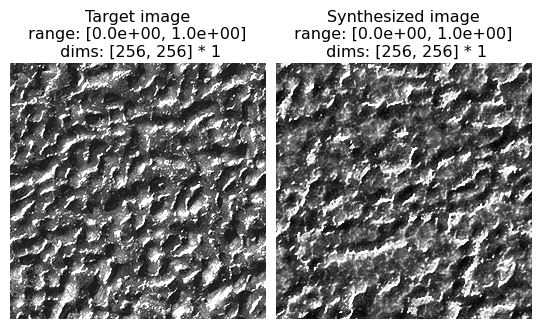

In [8]:
po.imshow([met.target_signal, met.synthesized_signal], title=['Target image', 'Synthesized image'], vrange='auto1');

And to further visualize the result we can plot: 1) the synthesized image, 2) the decreasing loss, and 3-end) the final model output error: `|model(target image) - model(synthesized image)|`.

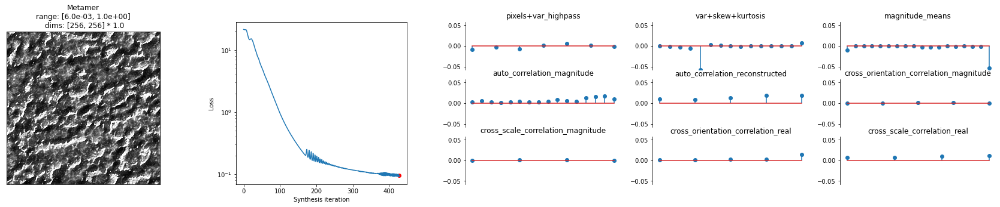

In [9]:
po.synth.metamer.plot_synthesis_status(met, width_ratios={'model_response_error': 3.1});
# why are there negatives?

## 2.1 What is a visual texture?

This model was developed to capture the statistical properties of visual textures.  

First off -- What is a visual texture? The simplest definition is a repeating visual pattern.  Below we load some examples.  We will use some of these same textures to demonstrate aspects of the Portilla Simoncelli model.

/Users/kathrynbonnen/Documents/work-repos/plenoptic/plenoptic/tools/data.py:100: UserWarning: Unable to load in file ../data/ps-texture-images/images/.DS_Store, it's probably not an image, skipping...
  "an image, skipping..." % p)
/Users/kathrynbonnen/Documents/work-repos/plenoptic/plenoptic/tools/data.py:109: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  im = color.rgb2gray(im)


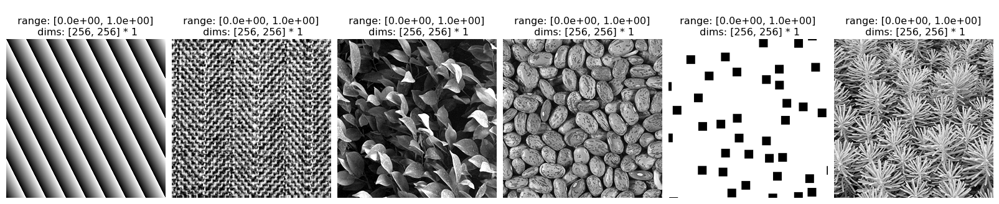

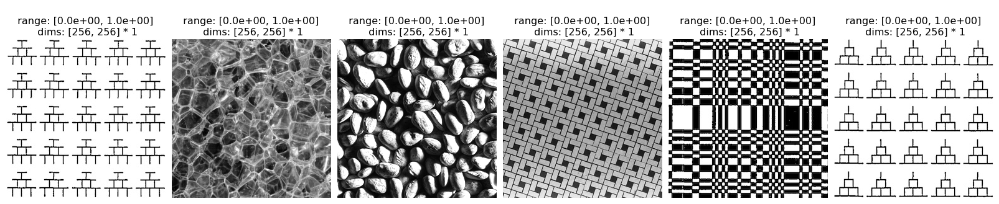

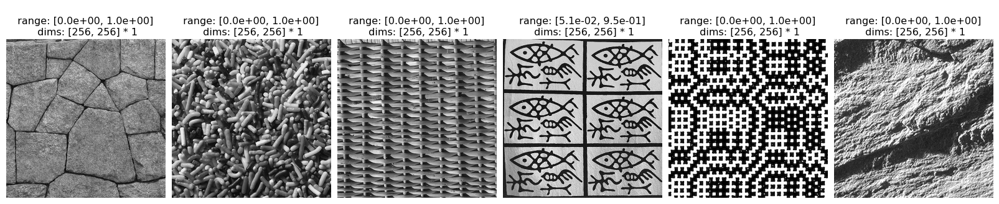

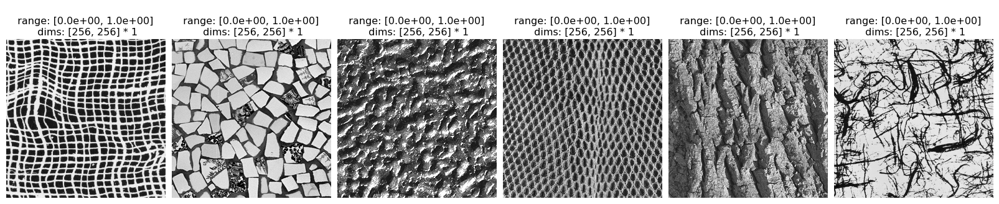

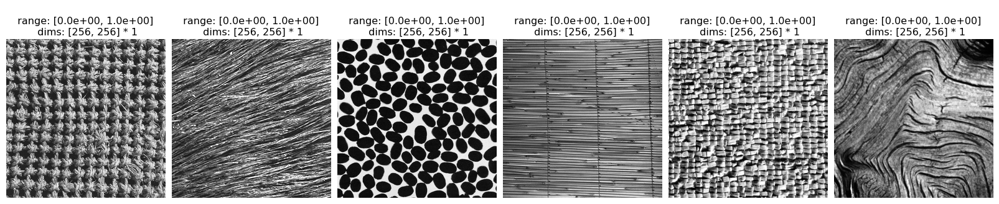

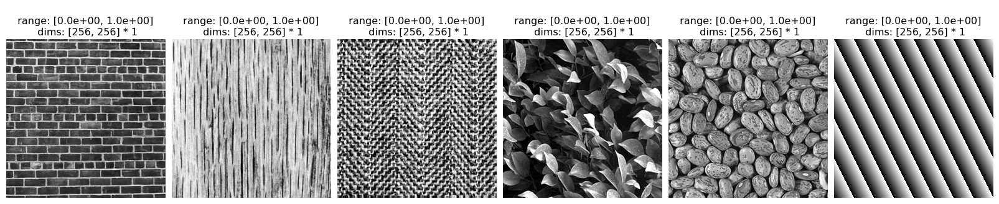

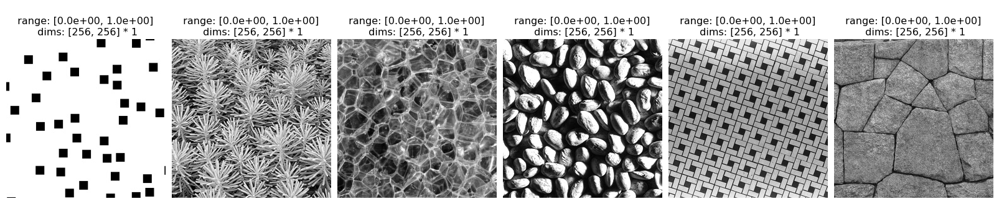

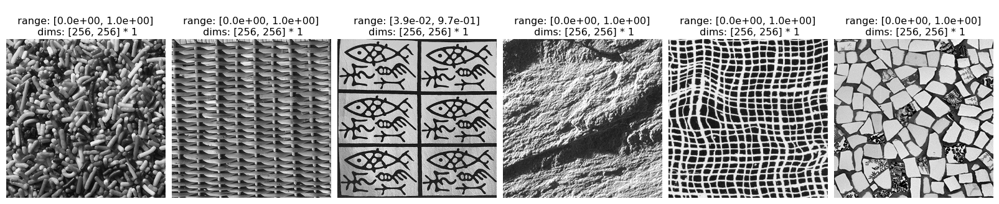

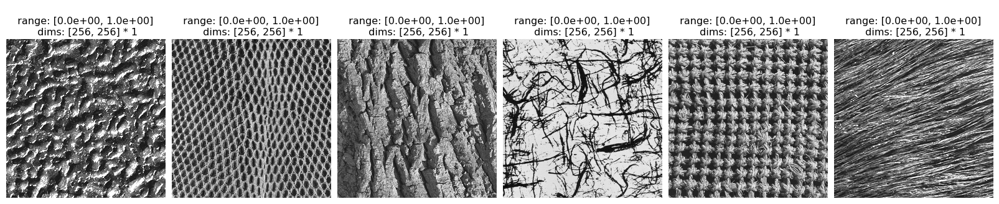

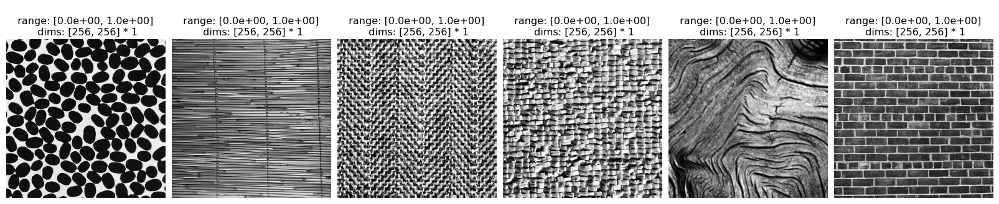

In [10]:
# Load and display a set of visual textures
directory = '../data/ps-texture-images/images/'
im_files = [os.path.join(directory, file) for file in os.listdir(directory)]
images = po.tools.load_images(im_files)
nImages = len(images)
nImagesPerRow = 6
for ii in range(0,math.floor(nImages/nImagesPerRow)*nImagesPerRow,nImagesPerRow):
    po.imshow(images[ii:ii+nImagesPerRow])

## 2.2 Steerable Pyramid

The Portilla-Simoncelli texture model is based a multi-scale over-complete wavelet representation (steerable pyramid).  The majority of the statistics calculated in the Portilla-Simoncelli texture model are computed as a function of the output of a steerable pyramid applied to the imaage.  Below is a 3-scale, 4-orientation complex steerable pyramid applied to an image (image shown first for reference). See  XXXX.ipynb for more details on Steerable Pyramids.  

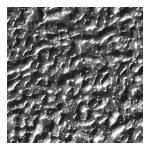

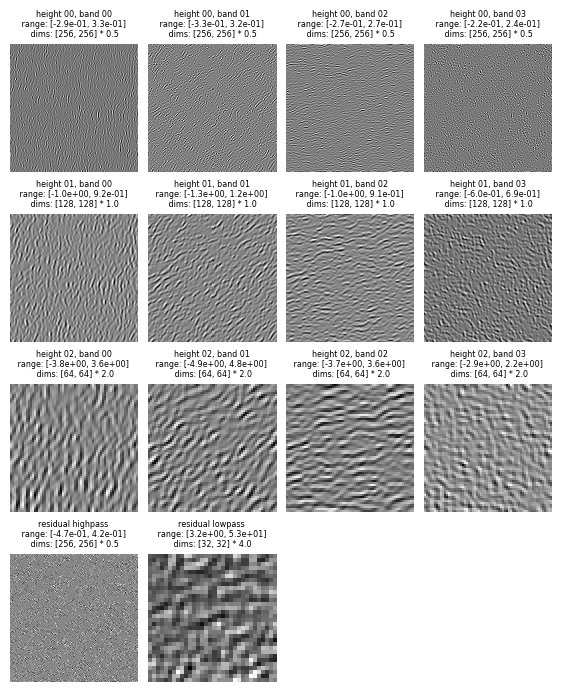

In [23]:
# calculate and display a steerable pyramid for an image
imsize=img.shape[-1]
pyr = po.simul.Steerable_Pyramid_Freq(height=3,image_shape=[imsize,imsize])
pyr_coeffs = pyr.forward(img)
fig = plt.figure(figsize=(2.5,2.5))
plt.imshow(img.squeeze(),cmap='gray')
plt.axis('off')
po.pyrshow(pyr_coeffs, zoom=0.5, batch_idx=0);


## 2.3 Texture Statistics
The Portilla-Simoncelli consists of a few different classes of statistics:
- Marginal Statistics.  These include pixel statistics (mean, variance, skew, kurtosis, and range of the pixel values), as well as the skewness and kurtosis of the lowpass images computed at each level of the recursive pyramid decomposition.
- Auto-Correlation Statistics.  These include the auto-correlation of the real-valued pyramid bands, as well as the auto-correlation of the magnitude of the pyramid bands, and the mean of the magnitude of the pyramid bands.
- Cross-Correlation Statistics.  These include correlations across scale and across orientation bands of the pyramid (both the for the real values of the pyramid and the magnitude of the pyramid bands).

The original paper uses synthesis to demonstrate the role of these different types of statistics.  They show that the statistics can be used to constrain a synthesis optimization to generate new examples of textures.  They also show that the absence of subsets of statistics results in synthesis failures.  Here we replicate those results.

The first step is to create a version of the Portilla Simoncelli model where certain statistics can be turned off.

In [36]:
from collections import OrderedDict
class PortillaSimoncelliRemove(po.simul.PortillaSimoncelli):
    r"""Model for measuring a subset of texture statistics reported by PortillaSimoncelli

    Currently we do not support batch measurement of images.

    Parameters
    ----------
    im_shape: int
        the size of the images being processed by the model
    remove_keys: list
        The dictionary keys for the statistics we will "remove".  In practice we set them to zero.
        
    n_scales: int, optional
        The number of pyramid scales used to measure the statistics (default=4)
    n_orientations: int, optional
        The number of orientations used to measure the statistics (default=4)
    spatial_corr_width: int, optional
        The width of the spatial cross- and auto-correlation statistics in the representation
    use_true_correlations: bool
        In the original Portilla-Simoncelli model the statistics in the representation
        that are labelled correlations were actually covariance matrices (i.e. not properly
        scaled).  In order to match the original statistics use_true_correlations must be
        set to false. But in order to synthesize metamers from this model use_true_correlations
        must be set to true (default).

    """
    def __init__(
        self,
        im_shape,
        remove_keys,
        n_scales=4,
        n_orientations=4,
        spatial_corr_width=9,
        use_true_correlations=True
    ):
        super().__init__(im_shape, n_scales=4, n_orientations=4, spatial_corr_width=9, use_true_correlations=True)
        
        self.remove_keys = remove_keys
        
    def forward(self, image, scales=None):
        
        r"""Generate Texture Statistics representation of an image with `remove_keys` removed.

        Parameters
        ----------
        image : torch.Tensor
            A tensor containing the image to analyze. We want to operate
            on this in the pytorch-y way, so we want it to be 4d (batch,
            channel, height, width). If it has fewer than 4 dimensions,
            we will unsqueeze it until its 4d
        scales : list, optional
            Which scales to include in the returned representation. If an empty
            list (the default), we include all scales. Otherwise, can contain
            subset of values present in this model's ``scales`` attribute.

        Returns
        -------
        representation_vector: torch.Tensor
            A flattened tensor (1d) containing the measured representation statistics.

        """
        
        stats=super().forward(image,scales=scales)
        stats_dict = self.convert_to_dict(stats)
        
        for kk in self.remove_keys:
            if isinstance(stats_dict[kk],OrderedDict):
                for (key,val) in stats_dict[kk].items():
                    stats_dict[kk][key] *= 0
            else:
                stats_dict[kk]*=0  # why can't you just remove the values here? there was a logistical problem, but what was it?

        list_of_stats = [
            torch.cat([vv.flatten() for vv in val.values()])
            if isinstance(val, OrderedDict)
            else val.flatten()
            for (key, val) in stats_dict.items()
        ]
        return torch.cat(list_of_stats)


def comparison(img_file, remove_statistics,seed=1):
    r""" Performs synthesis twice:  1) With the full Portilla-Simoncelli model. 
    2) Without the statistics specified by `remove_statistics`

        Parameters
        ----------
        img_file : 
            A tensor containing the file location for the image to be analyzed.
        remove_statistics : list
            Which statistics to include in the returned representation. 

        Returns
        -------
        met: Metamer
            Metamer from the full Portilla-Simoncelli Model
    
        met_select: Metamer
            Metamer from the Portilla-Simoncelli Model with some statistics removed.

        """
    img = po.tools.load_images(img_file)
    im_init = torch.rand_like(img) * .01 + img.mean()
    n=img.shape[-1]
    model = po.simul.PortillaSimoncelli([n,n])
    
    po.tools.set_seed(seed)
    model_select = PortillaSimoncelliRemove([n,n],remove_statistics)
    met = po.synth.Metamer(img, model, loss_function=po.tools.optim.l2_norm, initial_image=im_init)
    met.synthesize(
        max_iter=1000, 
        store_progress=True,
        coarse_to_fine='together',
        coarse_to_fine_kwargs={'change_scale_criterion': None, 'ctf_iters_to_check': 7}
        )
    
    po.tools.set_seed(seed)
    met_select = po.synth.Metamer(img, model_select, loss_function=po.tools.optim.l2_norm, initial_image=im_init)
    met_select.synthesize(
        max_iter=1000, 
        store_progress=True,
        coarse_to_fine='together',
        coarse_to_fine_kwargs={'change_scale_criterion': None, 'ctf_iters_to_check': 7}
        )
    
    return met, met_select

def run_synthesis(img_file,im_init=None):
    r""" Performs synthesis with the full Portilla-Simoncelli model. 

        Parameters
        ----------
        img_file : 
            A tensor containing the file location for the image to be analyzed.

        Returns
        -------
        met: Metamer
            Metamer from the full Portilla-Simoncelli Model
    
        met_select: Metamer
            Metamer from the Portilla-Simoncelli Model with some statistics removed.

        """
    img = po.tools.load_images(img_file)
    if im_init==None:
        im_init = torch.rand_like(img) * .01 + img.mean()
    n=img.shape[-1]


    model = po.simul.PortillaSimoncelli([n,n])
    met = po.synth.Metamer(img, model, loss_function=po.tools.optim.l2_norm, initial_image=im_init)
    met.synthesize(
        max_iter=1000, 
        store_progress=True,
        coarse_to_fine='together',
        coarse_to_fine_kwargs={'change_scale_criterion': None, 'ctf_iters_to_check': 3}
        )
    return met

### Marginal statistics 
Beginning with some of the marginal statistics, we'll demonstrate synthesis both with and without combinations of statistics.

The cell below replicates examples of synthesis failures with the following statistics removed:
- the pixel intensities: mean, variance, skew, kurtosis, minimum, maximum and 
- marginal statistics on the lowpass images computed at each level of the recursive pyramid (skew, kurtosis)

These statistics play an important role constraining the histogram of pixel intensities to match across the original and synthesized image. 

(see figure 3 of Portilla & Simoncelli 2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

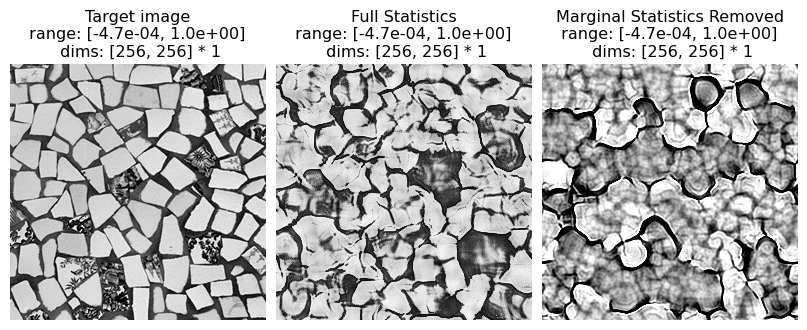

In [37]:
# make sure that the seed is getting set to the same.

# which statistics to remove
remove_statistics=['pixel_statistics','skew_reconstructed','kurtosis_reconstructed','magnitude_means']

# synthesis -- run on fig3a and fig3b to replicate paper
metamer, metamer_select = comparison('../data/ps-texture-images/images/fig3b.jpg', remove_statistics,seed=1) 

# visualize results
po.imshow([metamer.target_signal, metamer.synthesized_signal, metamer_select.synthesized_signal], title=['Target image', 'Full Statistics','Without Marginal Statistics'], vrange='auto1');

### Coefficient Correlations 
The cell below replicates examples of synthesis failures with the following statistics removed:
- local auto-correlations of the lowpass images computed at each level of the recursive pyramid

These statistics play a role in representing periodic structures and long-range correlations. For example, in the image named fig4a.jpg (the woven pattern) the absence of these statistics causes curves and even curved crossings in the texture absent in the synthesis with the full statistics.

(see figure 4 of Portilla & Simoncelli 2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

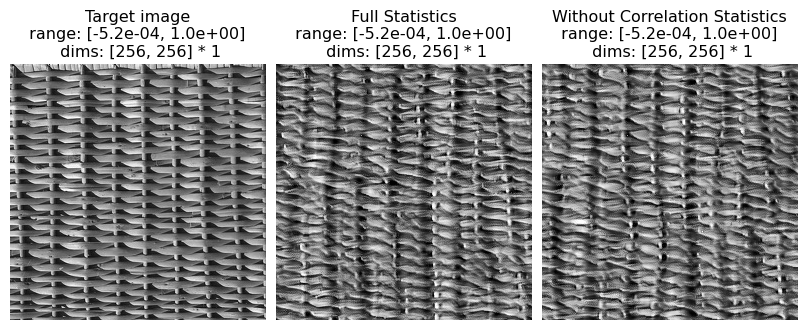

In [39]:
# which statistics to remove
remove_statistics = ['auto_correlation_reconstructed']

# synthesis -- run on fig4a and fig4b to replicate paper
metamer, metamer_select = comparison('../data/ps-texture-images/images/fig4a.jpg', remove_statistics) 

# visualize results
po.imshow([metamer.target_signal, metamer.synthesized_signal, metamer_select.synthesized_signal], title=['Target image', 'Full Statistics','Without Correlation Statistics'], vrange='auto1');

### Magnitude Correlation 
The cell below replicates examples of synthesis failures with the following statistics removed:
- correlation of the complex magnitude of pairs of coefficients at adjacent positions, orientations and scales.

These statistics play a role constraining high contrast locations to be organized along lines and edges across all scales. For example, in the image named fig6a.jpg the absence of these statistics results in a completely different organization of the orientation content in the edges.

(see figure 6 of Portilla & Simoncelli 2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

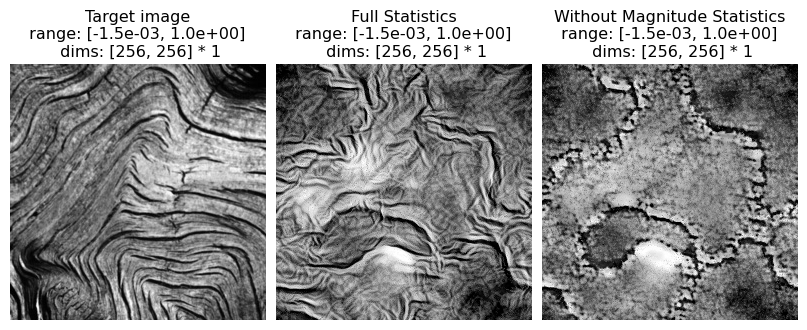

In [40]:
# which statistics to remove
remove_statistics = ['cross_orientation_correlation_magnitude','cross_scale_correlation_magnitude','auto_correlation_magnitude']

# synthesis -- run on fig6a and fig6b to replicate paper
metamer, metamer_select = comparison('../data/ps-texture-images/images/fig6a.jpg', remove_statistics) 

# visualize results
po.imshow([metamer.target_signal, metamer.synthesized_signal, metamer_select.synthesized_signal], title=['Target image', 'Full Statistics','Without Magnitude Statistics'], vrange='auto1');

### Cross-scale Phase Statistics 
The cell below replicates examples of synthesis failures with the following statistics removed :
- relative phase of coefficients of bands at adjacent scales

These statistics play a role constraining high contrast locations to be organized along lines and edges across all scales. These phase statistics are important in representing textures with strong illumination effects. When they are removed, the synthesized images appear much less three dimensional and lose the detailed structure of shadows.

(see figure 8 of Portilla & Simoncelli 2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

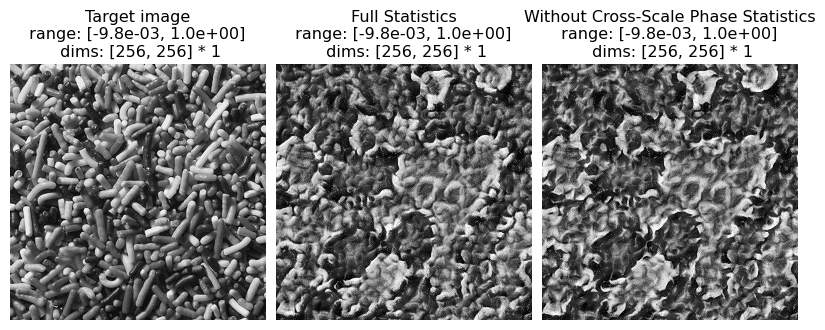

In [41]:
# which statistics to remove
remove_statistics = ['cross_scale_correlation_real']

# run on fig8a and fig8b to replicate paper
metamer, metamer_select = comparison('../data/ps-texture-images/images/fig8b.jpg', remove_statistics) 

# visualize results
po.imshow([metamer.target_signal, metamer.synthesized_signal, metamer_select.synthesized_signal], title=['Target image', 'Full Statistics','Without Cross-Scale Phase Statistics'], vrange='auto1');

## 3. Examples from different texture classes

### Artificial Textures 

(see figure 12 of Portilla Simoncelli 2000)



  0%|          | 0/1000 [00:00<?, ?it/s]

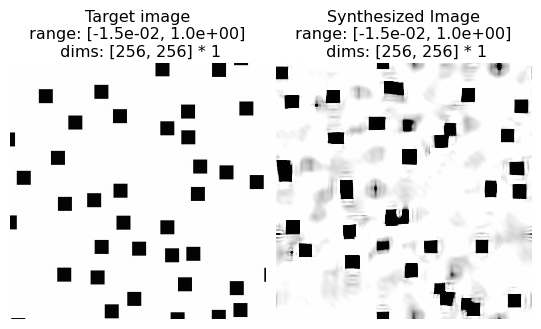

In [42]:
metamer = run_synthesis('../data/ps-texture-images/images/fig5b.jpg')
po.imshow([metamer.target_signal, metamer.synthesized_signal], title=['Target image', 'Synthesized Image'], vrange='auto1');

### Julesz Counterexamples 

(see figure 13 of Portilla & Simoncelli 2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

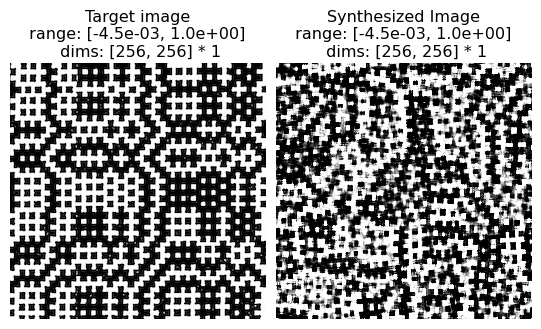

In [43]:
# Run on fig13a, fig13b, fig13c, fig13d to replicate examples in paper
metamer = run_synthesis('../data/ps-texture-images/images/fig13b.jpg') 
po.imshow([metamer.target_signal, metamer.synthesized_signal], title=['Target image', 'Synthesized Image'], vrange='auto1');

### Pseudo-periodic Textures 

(see figure 14 of Portilla & Simoncelli 2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

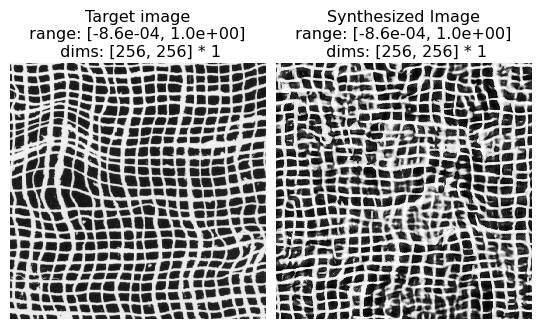

In [44]:
# Run on fig14a, fig14b, fig14c, fig14d to replicate examples in paper
metamer = run_synthesis('../data/ps-texture-images/images/fig14a.jpg') 
po.imshow([metamer.target_signal, metamer.synthesized_signal], title=['Target image', 'Synthesized Image'], vrange='auto1');

### Aperiodic Textures 

(see figure 15 of Portilla & Simoncelli 2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

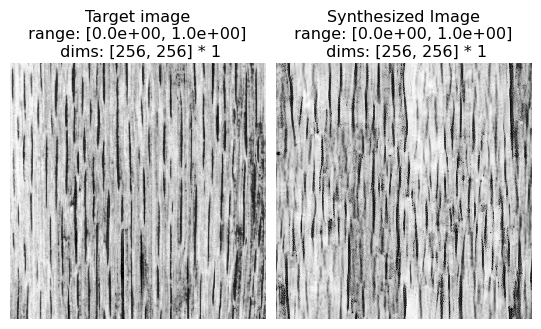

In [45]:
# Run on fig15a, fig15b, fig15c, fig15d to replicate examples in paper
metamer = run_synthesis('../data/ps-texture-images/images/fig15a.jpg') 
po.imshow([metamer.target_signal, metamer.synthesized_signal], title=['Target image', 'Synthesized Image'], vrange='auto1');

### Complex Structured Photographic Textures 

(see figure 16 of Portilla & Simoncelli 2000)

  0%|          | 0/1000 [00:00<?, ?it/s]

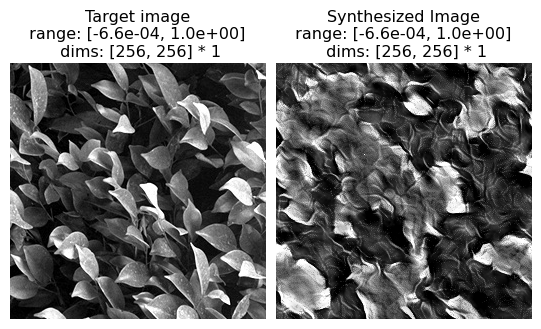

In [46]:
# Run on fig16a, fig16b, fig16c, fig16d to replicate examples in paper
metamer = run_synthesis('../data/ps-texture-images/images/fig16a.jpg') 
po.imshow([metamer.target_signal, metamer.synthesized_signal], title=['Target image', 'Synthesized Image'], vrange='auto1');

### Failures on some artificial textures

todo

## 4.1 Extrapolation

In [18]:
class MetamerFill(po.synth.Metamer):

    def __init__(self, target_signal: torch.Tensor, model: torch.nn.Module, mask: torch.Tensor,
             range_penalty_lambda = .1,
             loss_function = po.tools.optim.mse,
             allowed_range = (0, 1),
             initial_image = None):
        
        super().__init__(target_signal,
                        model,
                        loss_function = loss_function,
                        range_penalty_lambda=range_penalty_lambda,
                        allowed_range=allowed_range,
                        initial_image=initial_image)
        self.optimizer_mask = mask;

    
    def _init_optimizer(self, optimizer, scheduler):
        """Initialize optimizer and scheduler."""
        if optimizer is None:
            if self.optimizer is None:
                self.optimizer = torch.optim.Adam([torch.masked_select(self.synthesized_signal, self.optimizer_mask)],
                                                  lr=.01, amsgrad=True)
        else:
            if self.optimizer is not None:
                raise Exception("When resuming synthesis, optimizer arg must be None!")
            params = optimizer.param_groups[0]['params']
            if len(params) != 1 or not torch.equal(params[0], self.synthesized_signal):
                raise Exception("For metamer synthesis, optimizer must have one "
                                "parameter, the metamer we're synthesizing.")
            self.optimizer = optimizer
        self.scheduler = scheduler
        for pg in self.optimizer.param_groups:
            # initialize initial_lr if it's not here. Scheduler should add it
            # if it's not None.
            if 'initial_lr' not in pg:
                pg['initial_lr'] = pg['lr']
                
def run_fill_synthesis(img_file, mask):
    img = po.tools.load_images(img_file)
    im_init = torch.rand_like(img) * .01 + img.mean()
    im_init[~mask] = img[~mask]
    
    n=img.shape[-1]
    
    model = po.simul.PortillaSimoncelli([n,n])
    met = MetamerFill(img, model, mask, loss_function=po.tools.optim.l2_norm, initial_image=im_init)
    optimizer = torch.optim.Adam([met.synthesized_signal],lr=.005, amsgrad=True)
    met.synthesize(
        optimizer=optimizer,
        max_iter=4000, 
        store_progress=True,
        coarse_to_fine='together',
        coarse_to_fine_kwargs={'change_scale_criterion': None, 'ctf_iters_to_check': 3}
        )
    return met


  0%|          | 0/4000 [00:00<?, ?it/s]

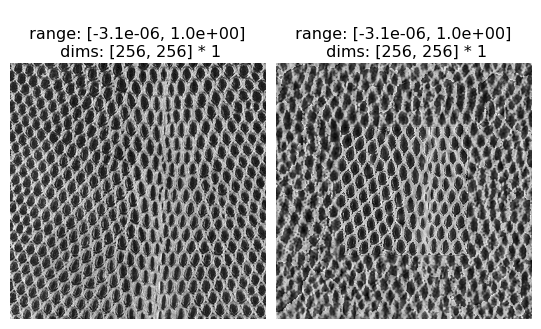

In [20]:
img = '../data/ps-texture-images/images/fig14b.jpg'
mask=torch.zeros(1,1,256,256).bool()
mask[:,:,64:192,64:192]=True
met = run_fill_synthesis(img,~mask)
po.imshow([met.target_signal,mask,met.synthesized_signal], vrange='auto1');

## 4.2 Mixtures

In [29]:
class PortillaSimoncelliMixture(po.simul.PortillaSimoncelli):

    def __init__(
        self,
        im_shape,
        n_scales=4,
        n_orientations=4,
        spatial_corr_width=9,
        use_true_correlations=True
    ):
        super().__init__(im_shape, n_scales=4, n_orientations=4, spatial_corr_width=9, use_true_correlations=True)
        
        
    def forward(self, imgs, scales=None):
        
        if imgs.shape[0]==2:
            stats0=super().forward(imgs[0,:,:,:],scales=scales)
            stats1=super().forward(imgs[1,:,:,:],scales=scales)

            return (stats0+stats1)/2
        
        elif imgs.shape[0]==1:
            stats = super().forward(imgs,scales=scales)
            return stats
            
class MetamerMixture(po.synth.Metamer):
    
    def _init_synthesized_signal(self, initial_image = None):
        """Initialize the synthesized image.

        Set the ``self.synthesized_signal`` attribute to be a parameter with
        the user-supplied data, making sure it's the right shape.

        Parameters
        ----------
        initial_image :
            The tensor we use to initialize the metamer. If None (the
            default), we initialize with uniformly-distributed random
            noise lying between 0 and 1.

        """
        if initial_image is None:
            synthesized_signal = torch.rand_like(self.target_signal)
            # rescale synthesized_signal to lie within the interval
            # self.allowed_range
            synthesized_signal = signal.rescale(synthesized_signal, *self.allowed_range)
            synthesized_signal.requires_grad_()
        else:
            synthesized_signal = initial_image.clone().detach()
            synthesized_signal = synthesized_signal.to(dtype=self.target_signal.dtype,
                                                       device=self.target_signal.device)
            synthesized_signal.requires_grad_()
            if synthesized_signal.ndimension() < 4:
                raise Exception("synthesized_signal must be torch.Size([n_batch"
                                ", n_channels, im_height, im_width]) but got "
                                f"{synthesized_signal.size()}")
        self.synthesized_signal = synthesized_signal
        self.losses.append(self.objective_function(self.model(synthesized_signal)).item())

def run_mixture_synthesis(img_files):
    imgs = po.tools.load_images(img_files)
    im_init = torch.rand_like(imgs[0,:,:,:].unsqueeze(0)) * .01 + imgs.mean()
    n=imgs.shape[-1]

    model = PortillaSimoncelliMixture([n,n])
    met = MetamerMixture(imgs, model, loss_function=po.tools.optim.l2_norm, initial_image=im_init)
    
    optimizer = torch.optim.Adam([met.synthesized_signal],lr=.02, amsgrad=True)

    met.synthesize(
        optimizer=optimizer,
        max_iter=4000, 
        store_progress=True,
        coarse_to_fine='together',
        coarse_to_fine_kwargs={'change_scale_criterion': None, 'ctf_iters_to_check': 3}
        )
    return met

  0%|          | 0/4000 [00:00<?, ?it/s]

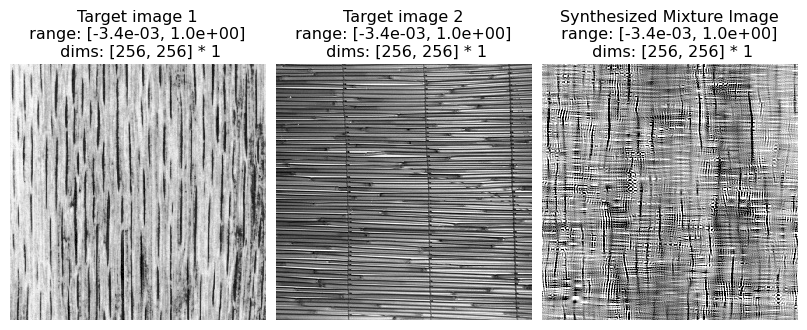

In [30]:
# Figure 20. Examples of “mixture” textures.
# To replicate paper use the following combinations: 
# (Fig. 15a, Fig. 15b); (Fig. 14b, Fig. 4a); (Fig. 15e, Fig. 14e).

imgs = ['../data/ps-texture-images/images/fig15a.jpg', '../data/ps-texture-images/images/fig15b.jpg']
met = run_mixture_synthesis(imgs)
po.imshow([met.target_signal,met.synthesized_signal], vrange='auto1',title=['Target image 1', 'Target image 2', 'Synthesized Mixture Image']);

/Users/kathrynbonnen/Documents/work-repos/plenoptic/plenoptic/tools/display.py:960: UserWarning: ax is not None, so we're ignoring figsize...
  warnings.warn("ax is not None, so we're ignoring figsize...")


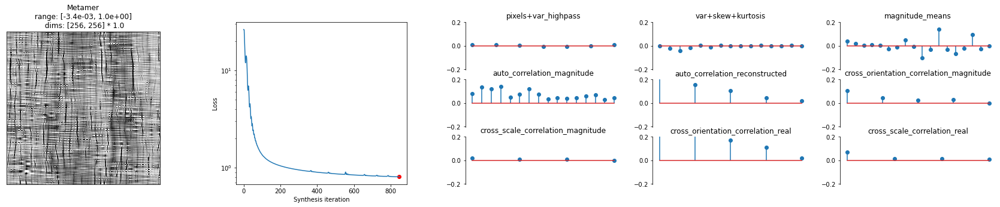

In [31]:
po.synth.metamer.plot_synthesis_status(met, width_ratios={'model_response_error': 3.1});

In [ ]:
# TODO: notable differences between Matlab and python:
#   1. primarily the proper 'cross-correlation' matrix).
#   2. point to the tests that show that the model outputs can be made the same
#   3. do a optimization comparison (matlab output to python output)